In [1]:
import pandas as pd
from Bio import SeqIO
import re

In [2]:
seq_iterator = SeqIO.parse(open("./phosphosite_sequences/Phosphosite_seq.fasta"), 'fasta')
seq_dict = {}
for seq in seq_iterator:
    # extract sequence id
    try:
        seq_id = seq.description.split('|')[-1]
    except IndexError:
        # For some reason, some sequences do not contain uniprot ids, so skip them
        continue
    seq_dict[seq_id] = str(seq.seq)


In [3]:
seq_dict

{'Q9R171': 'MLGVVELLLLGTAWLAGPARGQNETEPIVLEGKCLVVCDSNPTSDPTGTALGISVRSGSAKVAFSAIRSTNHEPSEMSNRTMIIYFDQVLVNIGNNFDSERSTFIAPRKGIYSFNFHVVKVYNRQTIQVSLMLNGWPVISAFAGDQDVTREAASNGVLIQMEKGDRAYLKLERGNLMGGWKYSTFSGFLVFPL',
 'P48771': 'MLRNLLALRQIAQRTISTTSRRHFENKVPEKQKLFQEDNGMPVHLKGGASDALLYRATMALTLGGTAYAIYLLAMAAFPKKQN',
 'Q9D772': 'MMEEIDRFQDPAAASISDRDCDAREEKQRELARKGSLKNGSMGSPVNQQPKKNNVMARTRLVVPNKGYSSLDQSPDEKPLVALDTDSDDDFDMSRYSSSGYSSAEQINQDLNIQLLKDGYRLDEIPDDEDLDLIPPKSVNPTCMCCQATSSTACHIQ',
 'P17515': 'MNPSAAVIFCLILLGLSGTQGIPLARTVRCNCIHIDDGPVRMRAIGKLEIIPASLSCPRVEIIATMKKNDEQRCLNPESKTIKNLMKAFSQKRSKRAP',
 'O70326': 'MNRTAYTVGALLLLLGTLLPTAEGKKKGSQGAIPPPDKAQHNDSEQTQSPPQPGSRTRGRGQGRGTAMPGEEVLESSQEALHVTERKYLKRDWCKTQPLKQTIHEEGCNSRTIINRFCYGQCNSFYIPRHIRKEEGSFQSCSFCKPKKFTTMMVTLNCPELQPPTKKKRVTRVKQCRCISIDLD',
 'B1AR51': 'MPGAKEQAALAESGDEEPGDPRLRLLGTFVARSLRPAAGTWERCAGTAEAGRLLQAFLDHNAASDPRPLLVVQSGPGGLVVTPGLDAGPEPSRARAKGLFFLRTKSEPPGNHSLRGTVLCGDLPAVPLEHLAPLLSEVIIPVLANEKNHLEWPHMVCQDIRHHAHTLKSDLLVIFEHMKGRTLLPLPVGSEKLEFVDG

In [5]:
phospho_data = pd.read_csv('./phosphosite_sequences/Phosphorylation_site_dataset', sep='\t', skiprows=3)
phospho_data

,GENE,PROTEIN,ACC_ID,HU_CHR_LOC,MOD_RSD,SITE_GRP_ID,ORGANISM,MW_kD,DOMAIN,SITE_+/-7_AA,LT_LIT,MS_LIT,MS_CST,CST_CAT#,Ambiguous_Site
0,0610009B22Rik,0610009B22Rik,Q8R3W2,11|11 B1.3,S119-p,1868286063,mouse,16.44,Sedlin_N,NPFYEPNsPIRSSAF,NaN,1.0,NaN,NaN,1
1,1110035H17Rik,1110035H17Rik,Q9CTA4,7|7,S10-p,7231581,mouse,24.31,NaN,RPPPGSRstVAQSPP,NaN,1.0,NaN,NaN,0
2,1110035H17Rik,1110035H17Rik,Q9CTA4,7|7,T11-p,7231583,mouse,24.31,NaN,PPPGSRstVAQSPPQ,NaN,1.0,NaN,NaN,0
3,YWHAB,14-3-3 beta,P31946,20q13.12,T2-p,15718712,human,28.08,NaN,______MtMDksELV,NaN,3.0,1.0,NaN,0
4,Ywhab,14-3-3 beta,Q9CQV8,2|2 H3,T2-p,15718712,mouse,28.09,NaN,______MtMDksELV,NaN,2.0,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378833,ZZZ3,ZZZ3,Q8IYH5,1p31.1,S606-p,23077718,human,102.02,NaN,GLPARPksPLDPKKD,NaN,6.0,4.0,NaN,0
378834,Zzz3,ZZZ3,Q6KAQ7,3|3 H3,S613-p,23077718,mouse,102.31,NaN,GLPARPKsPLDPKKD,NaN,3.0,NaN,NaN,0
378835,ZZZ3,ZZZ3,Q8IYH5,1p31.1,Y670-p,23077724,human,102.02,Myb_DNA-binding,LEQLLIKyPPEEVEs,NaN,NaN,1.0,NaN,0
378836,ZZZ3,ZZZ3,Q8IYH5,1p31.1,S677-p,23077721,human,102.02,Myb_DNA-binding,yPPEEVEsRRWQKIA,NaN,NaN,1.0,NaN,0


Check if only the first letter is a protein identifier

In [6]:
phospho_data['MOD_RSD'].apply(lambda x: x[0:2]).value_counts()

MOD_RSD
S1    66366
S2    40695
S3    32396
S4    25613
T1    23047
S5    20437
S6    17295
T2    14828
Y1    14647
S7    14318
T3    12159
S8    11972
S9    10543
Y2     9625
T4     9569
Y3     7566
T5     7391
T6     5919
Y4     5853
T7     4848
Y5     4433
T8     4036
Y6     3551
T9     3503
Y7     3239
Y8     2719
Y9     2220
H1        8
H7        4
K5        3
H8        3
R1        2
G1        2
H2        2
H3        2
N5        1
A5        1
I8        1
G6        1
K4        1
K2        1
A9        1
R2        1
K6        1
R6        1
P6        1
G3        1
L4        1
D3        1
R5        1
R4        1
F2        1
M7        1
P3        1
N8        1
D2        1
H6        1
K8        1
D1        1
Name: count, dtype: int64

Seems so.

In [7]:
import re

In [8]:
grouped = phospho_data.groupby(phospho_data['ACC_ID'])
for id, group in grouped:
    print(id)
    print(group['MOD_RSD'])


A0A024R4G9
43016    T14-p
43017    S16-p
43018    S20-p
Name: MOD_RSD, dtype: object
A0A075B759
249245     S40-p
249246     Y79-p
249247     T93-p
249248    T119-p
Name: MOD_RSD, dtype: object
A0A087WP46
160856     S359-p
160864     S972-p
160865     Y973-p
160866     S974-p
160867     S988-p
160868     S997-p
160870    T1000-p
160871    S1005-p
160873    S1015-p
160880    S1057-p
160886    S1107-p
Name: MOD_RSD, dtype: object
A0A087WPF7
32894      T32-p
32895      T43-p
32903     T622-p
32904     T626-p
32905     T798-p
32912     S941-p
32916     S956-p
32919    T1031-p
32920    S1038-p
32926    S1107-p
32927    T1108-p
32930    S1200-p
32934    S1235-p
32936    T1240-p
32939    S1252-p
Name: MOD_RSD, dtype: object
A0A087WQ53
221517    Y58-p
Name: MOD_RSD, dtype: object
A0A087WQ89
189418    S18-p
189420    S26-p
Name: MOD_RSD, dtype: object
A0A087WQP5
165757     S98-p
165758    S102-p
165759    S107-p
Name: MOD_RSD, dtype: object
A0A087WR82
126932     S88-p
126933     S89-p
126934    

In [9]:
len(grouped.groups.keys())

42257

In [10]:
phospho_data['MOD_RSD'].str.extract(r'[\w]([\d]+)-p')

,0
0,119
1,10
2,11
3,2
4,2
...,...
378833,606
378834,613
378835,670
378836,677


In [11]:
def extract_pos_info(dataset : pd.DataFrame):
    """
    Extracts phosphoryllation site indices from the dataset. 
    Locations expected in the column 'MOD_RSD'.
    
    Returns a dictionary in format {ACC_ID : [list of phosphoryllation site indices]}
    """
    dataset['position'] = dataset['MOD_RSD'].str.extract(r'[\w]([\d]+)-p')
    grouped = dataset.groupby(dataset['ACC_ID'])
    res = {}
    for id, group in grouped:
        res[id] = group['position'].to_list()
    
    return res

phospho_data_pos = extract_pos_info(phospho_data)


In [12]:
phospho_data_pos

{'A0A024R4G9': ['14', '16', '20'],
 'A0A075B759': ['40', '79', '93', '119'],
 'A0A087WP46': ['359',
  '972',
  '973',
  '974',
  '988',
  '997',
  '1000',
  '1005',
  '1015',
  '1057',
  '1107'],
 'A0A087WPF7': ['32',
  '43',
  '622',
  '626',
  '798',
  '941',
  '956',
  '1031',
  '1038',
  '1107',
  '1108',
  '1200',
  '1235',
  '1240',
  '1252'],
 'A0A087WQ53': ['58'],
 'A0A087WQ89': ['18', '26'],
 'A0A087WQP5': ['98', '102', '107'],
 'A0A087WR82': ['88', '89', '92', '100', '137', '221'],
 'A0A087WUL8': ['364',
  '608',
  '852',
  '1096',
  '1340',
  '1584',
  '1828',
  '2072',
  '2316',
  '2560',
  '2804',
  '3048',
  '3292',
  '3536'],
 'A0A096LNH2': ['799', '801', '895'],
 'A0A096LP49': ['478', '519', '566'],
 'A0A096LP55': ['11'],
 'A0A096MIZ1': ['315', '347', '348', '355', '358'],
 'A0A096MJJ4': ['501'],
 'A0A096MJN4': ['170', '306'],
 'A0A096MJT6': ['1355',
  '1681',
  '2597',
  '2598',
  '2601',
  '2603',
  '2607',
  '2755',
  '3723',
  '3725',
  '3726',
  '4124'],
 'A0A096MK

In [13]:
def create_sequence_postion_dataset(protein_data : dict, phospho_data : dict):
    """
    Creates a dataset with format { protein sequence : [list of phosphoryllation sites] } from the input datasets. 

    protein_data: should be a dictionary { protein ID : str(protein sequence)}
    phospho_data: should be a dictionary { protein_ID : [list of phosphoryllation sites] } 
    """
    res = {}
    res['id'] = []
    res['sites'] = []
    res['sequence'] = []
    for idx in phospho_data.keys():
        res['id'].append(idx)
        res['sequence'].append(protein_data[idx])
        res['sites'].append(phospho_data[idx])

    return pd.DataFrame.from_dict(res, orient='columns')

sp_dataset = create_sequence_postion_dataset(seq_dict, phospho_data_pos)

In [14]:
sp_dataset

,id,sites,sequence
0,A0A024R4G9,"[14, 16, 20]",MTVLEAVLEIQAITGSRLLSMVPGPARPPGSCWDPTQCTRTWLLSH...
1,A0A075B759,"[40, 79, 93, 119]",MVNSVVFFEITRDGKPLGRISIKLFADKIPKTAENFRALSTGEKGF...
2,A0A087WP46,"[359, 972, 973, 974, 988, 997, 1000, 1005, 101...",MARDGAEQPDSGPLPRPSPCPQEDRASNLMPPKPPRTWGLQLQGPS...
3,A0A087WPF7,"[32, 43, 622, 626, 798, 941, 956, 1031, 1038, ...",MDGPTRGHGLRKKRRSRSQRDRERRSRAGLGTGAAGGIGAGRTRAP...
4,A0A087WQ53,[58],MGQNNNVTEFILLGLTQDPAGQKVLFVMFLLIYIVKIVGNLLIVGT...
...,...,...,...
42252,XP_997087,"[347, 907, 915, 918, 927]",MENFLALMNSISDTWMSPSCMDIAMDMGIAFVCGAGLFFLLLPFLK...
42253,YP_009725299,"[504, 660, 661, 794, 1826]",APTKVTFGDDTVIEVQGYKSVNITFELDERIDKVLNEKCSAYTVEL...
42254,YP_009725305,[5],NNELSPVALRQMSCAAGTTQTACTDDNALAYYNTTKGGRFVLALLS...
42255,YP_009725309,[56],AENVTGLFKDCSKVITGLHPTQAPTHLSVDTKFKTEGLCVDIPGIP...


In [23]:
sp_dataset['sequence'].apply(lambda x: len(x)).mean()

666.4395721418937

In [22]:
sp_dataset['sequence'].apply(lambda x: len(x)).median()

498.0

In [27]:
sp_dataset['sites'].apply(lambda x: len(x)).median()

4.0

In [26]:
total_length = sp_dataset['sequence'].apply(lambda x: len(x)).sum()
site_percentage = sp_dataset['sites'].apply(lambda x: len(x)).sum() / total_length
site_percentage * 100

1.3452153182170545

In [16]:
sp_dataset = pd.read_json('phosphosite_sequences/phosphosite_df.json')
sp_dataset[sp_dataset['sequence'].isna()]

,id,sites,sequence


In [17]:
# Can be missing if sequence parsing is improper
seq_dict['BAA34185.2']

'MVPLVQPTTPAYRPLPSHLSADTEVRGRGTLVHEAQLNCFYISPGGSNYGSPRPAHANINANAAAGLAPEHIPTPGAALSWQAAIDAGRQAKLMGSAGNTTISTVSSTQRKRQQYGKPKKQSGTTATRPPRALLCLTLKNPIRRACISIVEWKPFEIIILLTIFANCVALAIYIPFPEDDSNATNSNLERVEYLFLIIFTVEAFLKVIAYGLLFHPNAYLRNGWNLLDFIIVVVGLFSAILEQATKADGANALGGKGAGFDVKALRAFRVLRPLRLVSGVPSLQVVLNSIIKAMVPLLHTALLVLFVIIIYAIIGLELFMGKMHKTCYNQEGITDVPAEEDPSPCALESGHGRQCQNGTVCKPGWDGPKHGITNFDNFAFAMLTVFQCITMEGWTDVLYWMQDAMGYELPWVYFVSLVIFGSFFVLNLVLGVLSGEFSKEREKAKARGDFQKLREKQQLEEDLKGYLDWITQAEDIDPENEDEGVDEEKPRNMSMPTSETESVNTENVAGGDIEGENCGARLAHRISKSKFSRYWRRWNRFCRRKCRAAVKSNVFYWLVIFLVFLNTLTIASEHYNQPHWLTEVQDTANKALLALFTAEMLLKMYSLGLQAYFVSLFNRLDCFIVCGGILETILVETKIMSPLGISVLRCVRLLRIFKITRYWNSLSNLVASLLNSVRSIASLLLLLFLFIIIFSLLGMQLFGGKFNFDEMRTRRSTFDNFPQSLLTVFQILTGEDWNSVMYDGIMAYGGPSFPGMLVCIYFIILFICGNYILLNVFLAIAVDNLADAESLTSAQKEEEEEKERKKLARTASPEKKQEVVEKPAVEETKEEKIELKSITADGESPPTTKINMDDLQPNENEDKSPYPNPDAAGEEDEEEPEMPVGPRPRPLSELHLKEKAVPMPEASAFFIFSPNNRFRLQCHRIVNDTIFTNLILFFILLSSISLAAEDPVQHTSFRNHILFYFDIVFTTIFTIEIALKMTAYGAFLHKGSFCRNYFN

In [24]:
sp_dataset.to_json('phosphosite_df.json', indent=4)

In [31]:
import glob
import numpy as np

res = []

for prot in glob.glob('./sequences/*.npy'):
    fixed_path = re.sub('\uf07c', '|', prot)
    fixed_path = re.sub('\uf03a', ':', fixed_path)
    seq_id = re.findall(r'GN:.+\|.+\|.+\|(.+)\.npy', fixed_path)[0]
    emebddings = np.load(prot)

    if not seq_id in phospho_data_pos:
        continue

    sites = [eval(i) - 1 for i in phospho_data_pos[seq_id]]
    targets = np.zeros(shape=(emebddings.shape[0]))
    targets[sites] = 1
    targets = targets.reshape(-1, 1)
    res.append(np.hstack((emebddings, targets), dtype=np.float32))

res = np.vstack(res)

np.save('small_dataset.npy', res)

In [12]:
import tensorflow as tf
import glob
import numpy as np 
import argparse

parser = argparse.ArgumentParser()

parser.add_argument('-p', help='File containing the phosphosite dataset')
parser.add_argument('-e', help='Directory containing embedding .npy files')
parser.add_argument('-o', help='Output dir')

def float_feature(value):
    """Returns a float_list from a list of float / double."""
    return tf.train.Feature(float_list=tf.train.FloatList(value=value))

def int32_feature(value):
    """Returns an int64_list from a bool / enum / int / uint."""
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

def create_example(embed, sites):
    feature = {
        "embeddings": float_feature(embed),
        "sites" : int32_feature(sites)
    }
    return tf.train.Example(features=tf.train.Features(feature=feature))

def parse_tfrecord_fn(example):
    feature_description = {
        "embeddings" : tf.io.FixedLenFeature([], tf.float32),
        "sites" : tf.io.VarLenFeature(dtype=tf.int64)
    }
    example = tf.io.parse_single_example(example, feature_description)
    return example

def serialize_data(args, data, idx):
    with tf.io.TFRecordWriter(
        f'{args.e}/embeds_{idx}.tfrec', 
    ) as writer:
        for example in data:
            writer.write(example.SerializeToString())

def extract_pos_info(dataset : pd.DataFrame):
    """
    Extracts phosphoryllation site indices from the dataset. 
    Locations expected in the column 'MOD_RSD'.
    
    Returns a dictionary in format {ACC_ID : [list of phosphoryllation site indices]}
    """
    dataset['position'] = dataset['MOD_RSD'].str.extract(r'[\w]([\d]+)-p')
    grouped = dataset.groupby(dataset['ACC_ID'])
    res = {}
    for id, group in grouped:
        res[id] = group['position'].to_list()
    
    return res

def prep_data(args, phospho_data_pos):
    buffer = []
    buff_max_size = 10000
    idx = 0
    for prot in glob.glob(f'{args.e}/*.npy'):
        if len(buffer) == buff_max_size:
            serialize_data(buffer, idx)
            idx += 1
            buffer = []
    
        fixed_path = re.sub('\uf07c', '|', prot)
        fixed_path = re.sub('\uf03a', ':', fixed_path)
        seq_id = re.findall(r'GN:.+\|.+\|.+\|(.+)\.npy', fixed_path)[0]
        emebddings = np.load(prot)
        
        if not seq_id in phospho_data_pos:
            continue
        
        sites = [eval(i) - 1 for i in phospho_data_pos[seq_id]]
        targets = np.zeros(shape=(emebddings.shape[0]), dtype=np.int32)
        targets[sites] = 1
        targets = targets.reshape(-1, 1)
        example = create_example(emebddings, sites)
        buffer.append(example)
        break

def main(args):
    phospho_data = pd.read_csv(args.p, sep='\t', skiprows=3)
    phospho_data_pos = extract_pos_info(phospho_data)
    prep_data(phospho_data_pos)
    
if __name__ == '__main__':
    args = parser.parse_args()
    main(args)

usage: ipykernel_launcher.py [-h] [-p P] [-e E] [-o O]
ipykernel_launcher.py: error: unrecognized arguments: --f=c:\Users\Samo\AppData\Roaming\jupyter\runtime\kernel-v2-41565o0VMJGOSaCT.json


SystemExit: 2

C:\Users\Samo\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py:3534: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [34]:
dataset = np.load('small_dataset.npy')
dataset.shape

(161266, 1025)

Generate embeddings for available proteins (from `https://github.com/agemagician/ProtTrans`)

Split the sequences into smaller chunks for easier processing

In [6]:
seq_iterator = SeqIO.parse(open("phosphosite_sequences/Phosphosite_seq.fasta"), 'fasta')
buffer = []
idx = 0
buf_idx = 0
for seq in seq_iterator:
    if idx == 1000:
        with open(f'sequences_{buf_idx}.fasta', 'w') as f:
            f.write('\n'.join(buffer))
        buffer = []
        idx = 0
        buf_idx += 1
    if seq.description.split('|')[-1] not in phospho_data_pos:
        continue
    string = f'>{seq.description}\n{str(seq.seq)}'
    buffer.append(string)
    idx += 1

if len(buffer) != 0:
    with open(f'sequences_{buf_idx}.fasta', 'w') as f:
        f.write('\n'.join(buffer))
    

# EPSD Dataset processing

In [46]:
import numpy as np
def load_fasta(path : str):
    seq_iterator = SeqIO.parse(open(path), 'fasta')
    seq_dict = {}
    for seq in seq_iterator:
        # extract sequence id
        try:
            seq_id = seq.id.split('|')[0]
        except IndexError:
            # For some reason, some sequences do not contain uniprot ids, so skip them
            continue
        seq_dict[seq_id] = str(seq.seq)
    
    return seq_dict

def load_phospho(path : str):
    data = pd.read_csv(path, sep='\t')
    data.index = data['EPSD ID']
    grouped = data.groupby(data['EPSD ID'])

    res = {}
    for id, group in grouped:
        res[id] = group['Position'].to_list()
    
    return res

def get_inputs_outputs(fasta_path, phospho_path):
    fasta = load_fasta(fasta_path)
    phospho = load_phospho(phospho_path)

    inputs = []
    targets = []
    for key in phospho.keys():
        inputs.append(fasta[key])
        targets.append(phospho[key])

    return inputs, targets

In [44]:
from torch.utils.data import Dataset

class ProteinDataset(Dataset):
    def __init__(self, fasta_path, phospho_path) -> None:
        self.x, self.y = get_inputs_outputs(fasta_path, phospho_path)

    def __getitem__(self, index):
        return self.x[index], self.y[index]

    def __len__(self):
        return len(self.x)

In [47]:
np_dataset = ProteinDataset('epsd_sequences/Total.fasta', 'epsd_sequences/Total.txt')

In [ ]:
import os
os.path.join()

In [12]:
def filter_dataset(all_data, phospho_data):
    return { key : all_data[key] for key in all_data if key in phospho_data}

filtered_data = filter_dataset(seq_dict, phospho_data_pos)
len(filtered_data.keys())

42246

In [15]:
buffer = []
for seq in filtered_data:
    string = f'>{seq}\n{str(filtered_data[seq])}'
    buffer.append(string)

with open(f'filtered_sequences.fasta', 'w') as f:
    f.write('\n'.join(buffer))

In [19]:
cluster30 = pd.read_csv('cluster30.tsv', sep='\t', names=['cluser_rep', 'cluster_mem'])
cluster90 = pd.read_csv('cluster90.tsv', sep='\t', names=['cluser_rep', 'cluster_mem'])

In [20]:
cluster30

,cluser_rep,cluster_mem
0,P60901,P60901
1,P60901,Q9QUM9
2,P60901,P60900
3,P10362,P10362
4,P10362,Q03517
...,...,...
42241,D3ZXD8,B1AZA5
42242,D3ZXD8,Q9H330
42243,Q9QYW0,Q9QYW0
42244,Q9QYW0,Q9JKX4


In [21]:
cluster30.groupby(cluster30['cluser_rep']).count()

,cluster_mem
cluser_rep,
A0A024R4G9,1
A0A087WP46,2
A0A087WQ89,3
A0A087WQP5,1
A0A087WR82,2
...,...
XP_991011,2
XP_996053,5
YP_009725299,1


In [30]:
grouped30 = cluster30.groupby(cluster90['cluser_rep']).count()

In [31]:
grouped90 = cluster90.groupby(cluster90['cluser_rep']).count()

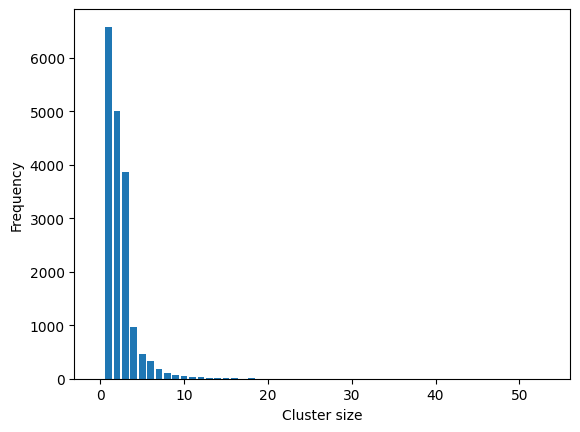

In [39]:
import matplotlib.pyplot as plt
import numpy as np

counts = np.bincount(grouped30['cluster_mem'])
plt.bar(np.arange(len(counts)), counts, label='Cluster sizes, sensitivity = 0.3')
plt.xlabel('Cluster size')
plt.ylabel('Frequency')
plt.show()

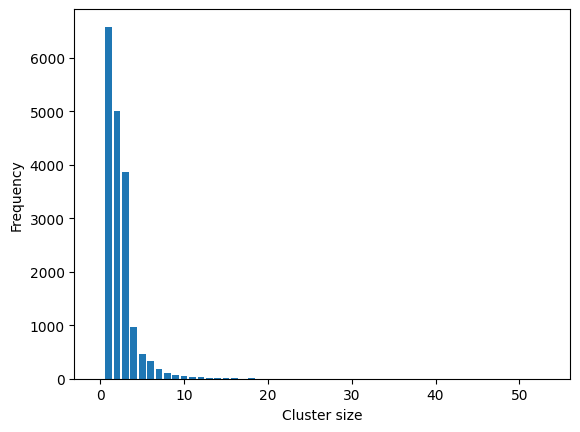

In [41]:
counts = np.bincount(grouped90['cluster_mem'])
plt.bar(np.arange(len(counts)), counts)
plt.xlabel('Cluster size')
plt.ylabel('Frequency')
plt.show()

In [1]:
p1 = np.array([1,-1,1,1])
p1y = np.array([1,-1,1,-1])
p2 = np.array([-1,1,1,-1])
p2y = np.array([-1,-1,1,-1])
w1 = np.outer(p1, p1y)
w2 = np.outer(p2, p2y)

w3 = w1 + w2
w3

NameError: name 'np' is not defined

In [50]:
x0 = np.array([-1, -1, 1, -1])
y0 = np.sign(x0 @ w3)
energy = -1/2 * (x0 @ w3 @ y0)
energy

-4.0

In [49]:
np.sign(x0)

array([-1, -1,  1, -1])

In [5]:
from transformers import TrainingArguments, Trainer, BertModel, BertTokenizer

tokenizer = BertTokenizer.from_pretrained("Rostlab/prot_bert", do_lower_case=False)

In [1]:
import pandas as pd
import numpy as np 
from datasets import Dataset

c:\Users\Samo\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def create_dataset(tokenizer, seqs, labels, max_length):
    tokenized = tokenizer(seqs, max_length=max_length, padding=False, truncation=True)
    dataset = Dataset.from_dict(tokenized)
    # we need to cut of labels after max_length positions for the data collator to add the correct padding ((max_length - 1) + 1 special tokens)
    labels = [l[: max_length - 1] for l in labels] 
    dataset = dataset.add_column("labels", labels)
     
    return dataset


def preprocess_data(df : pd.DataFrame):
    df['sequence'] = df['sequence'].str.replace('|'.join(["O","B","U","Z"]),"X",regex=True)
    df['sequence'] = df.apply(lambda row : " ".join(row["sequence"]), axis = 1)
    return df

def get_inputs_outputs(dataset_path):
    df = pd.read_json(dataset_path)
    df = df.dropna()
    mask = df['sequence'].apply(lambda x: len(x) < 1024)
    df = df[mask]
    df['sites'] = df['sites'].apply(lambda x: [eval(i) - 1 for i in x])
    labels = [np.zeros(shape=len(s)) for s in df['sequence']]
    for i, l in enumerate(labels):
        l[df.iloc[i]['sites']] = 1

    df['label'] = labels
    
    return df[['sequence', 'label']]

In [3]:
path = './phosphosite_sequences/phosphosite_df.json'
data = get_inputs_outputs(path)

In [7]:
prepped = preprocess_data(data)
tokenized = tokenizer(list(prepped['sequence']), max_length=1024, padding=False, truncation=True)
prepped['sequence'] = prepped.sequence.apply(lambda x: tokenizer(x, max_length=1024, padding=False, truncation=True))
labels = [l[: 1023] for l in prepped['label']]
prepped['label'] = labels

In [9]:
prepped['sequence'].iloc[0]

{'input_ids': [2, 21, 15, 8, 5, 9, 6, 8, 5, 9, 11, 18, 6, 11, 15, 7, 10, 13, 5, 5, 10, 21, 8, 16, 7, 16, 6, 13, 16, 16, 7, 10, 23, 24, 14, 16, 15, 18, 23, 15, 13, 15, 24, 5, 5, 10, 22, 15, 16, 13, 13, 13, 24, 11, 10, 7, 5, 16, 13, 6, 10, 23, 13, 5, 7, 9, 9, 16, 16, 16, 5, 16, 20, 23, 14, 18, 6, 20, 7, 9, 9, 5, 10, 11, 13, 22, 13, 9, 15, 24, 6, 24, 5, 10, 13, 15, 14, 15, 6, 24, 16, 7, 6, 16, 7, 8, 12, 18, 6, 13, 11, 5, 7, 9, 5, 5, 5, 8, 3], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [17]:
tokenized.to_json('./phosphosite_sequences/pretokenized_1024.json')

Creating json from Arrow format:   0%|          | 0/36 [00:00<?, ?ba/s]

Creating json from Arrow format: 100%|██████████| 36/36 [00:03<00:00, 10.08ba/s]


179585674

In [8]:
sp_dataset.head(5)

,id,sites,sequence
0,A0A024R4G9,"[14, 16, 20]",MTVLEAVLEIQAITGSRLLSMVPGPARPPGSCWDPTQCTRTWLLSH...
1,A0A075B759,"[40, 79, 93, 119]",MVNSVVFFEITRDGKPLGRISIKLFADKIPKTAENFRALSTGEKGF...
2,A0A087WP46,"[359, 972, 973, 974, 988, 997, 1000, 1005, 101...",MARDGAEQPDSGPLPRPSPCPQEDRASNLMPPKPPRTWGLQLQGPS...
3,A0A087WPF7,"[32, 43, 622, 626, 798, 941, 956, 1031, 1038, ...",MDGPTRGHGLRKKRRSRSQRDRERRSRAGLGTGAAGGIGAGRTRAP...
4,A0A087WQ53,[58],MGQNNNVTEFILLGLTQDPAGQKVLFVMFLLIYIVKIVGNLLIVGT...


In [12]:
sp_dataset.apply(lambda row: [sp_dataset.loc[row]['sequence'][i] for i in sp_dataset.loc[row]['sites']])

KeyError: 'sites'

In [4]:
import numpy as np

p = 0.4
ret = 2.5
fee = 0.1

results = []
for i in range(1000000):
    e = np.random.rand()
    money = -fee 
    if e < p:
        money += ret
    
    results.append((money - 1) * 100)

print(np.mean(results))

-10.000750000000002


In [5]:
1.4*0.4 - 1.1*0.6

-0.10000000000000009

In [6]:
1.1*0.4

0.44000000000000006

In [8]:
1.1/0.4

2.75